# NN Deep Dive Laboratory

**A deep neural network exploration notebook using NumPy and Matplotlib only.**

This notebook is designed to understand:
1. **Initialization effects** — How weight scale affects training
2. **Activation function behavior** — Sigmoid vs ReLU in deep networks
3. **Vanishing and exploding gradients** — The multiplicative chain rule
4. **Loss landscape geometry** — Non-convexity, saddle points, flat regions
5. **Why gradient management techniques are necessary**

*No PyTorch, TensorFlow, or high-level libraries. Pure NumPy + Matplotlib.*

---
## Section 0: Setup

### Dataset: Two Moons

We use **sklearn only for data generation** (`make_moons`); all learning is implemented with NumPy.

The **two-moons** dataset is a synthetic binary classification benchmark with:
- **Shape**: Two interleaving crescent-shaped clusters, each belonging to one class (0 or 1)
- **Non-linear separability**: A linear model cannot separate the classes; neural networks with hidden layers are needed
- **2D features**: Easy to visualize decision boundaries and loss landscapes
- **Parameters**: `n_samples=500`, `noise=0.15` — 500 points total with moderate Gaussian noise for realistic overlap
- **Classes**: Balanced (250 samples each when using default split)
- **Feature range**: Typically in [-1.5, 2.5] for both dimensions

### MultiLayerNN API

Import `MultiLayerNN` from the module. It supports:
- **layer_dims + activation**: `MultiLayerNN([2, 4, 4, 1], activation="sigmoid", ...)`
- Configurable initialization: xavier, he, small, large, or `weight_init_std`
- **track_stats=True** in `fit()`: records loss history, gradient norms per layer, activation statistics per layer

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Needed for 3D projection
from sklearn.datasets import make_moons

from multi_layer_nn import MultiLayerNN

np.random.seed(42)

# Two moons: non-linear binary classification, 2D features. 500 samples for stable results.
X_data, y_data = make_moons(n_samples=500, noise=0.15, random_state=42)
y_data_2d = y_data.reshape(-1, 1)
print("Moons dataset:", X_data.shape, y_data.shape)

Moons dataset: (500, 2) (500,)


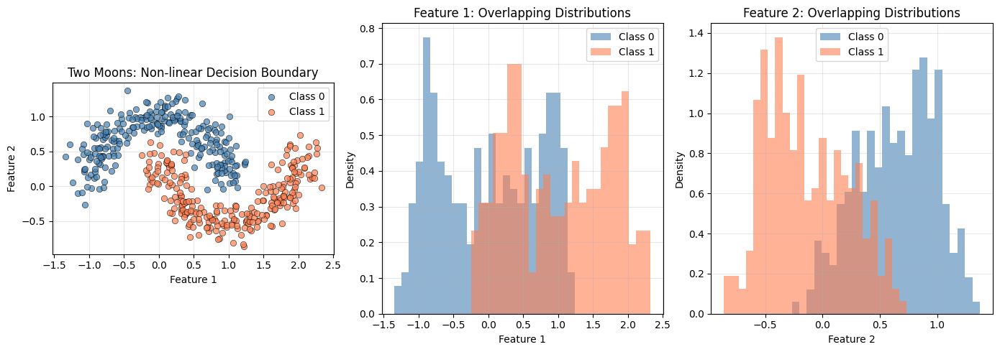

In [2]:
# Visualize the two-moons dataset
fig, axes = plt.subplots(1, 3, figsize=(14, 5))

# Left: 2D scatter plot colored by class (main view)
ax = axes[0]
ax.scatter(X_data[y_data == 0, 0], X_data[y_data == 0, 1], c="steelblue", label="Class 0", alpha=0.7, edgecolors="k", linewidths=0.5)
ax.scatter(X_data[y_data == 1, 0], X_data[y_data == 1, 1], c="coral", label="Class 1", alpha=0.7, edgecolors="k", linewidths=0.5)
ax.set_xlabel("Feature 1")
ax.set_ylabel("Feature 2")
ax.set_title("Two Moons: Non-linear Decision Boundary")
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_aspect("equal")

# Middle: Feature 1 distribution per class
ax = axes[1]
ax.hist(X_data[y_data == 0, 0], bins=25, alpha=0.6, label="Class 0", color="steelblue", density=True)
ax.hist(X_data[y_data == 1, 0], bins=25, alpha=0.6, label="Class 1", color="coral", density=True)
ax.set_xlabel("Feature 1")
ax.set_ylabel("Density")
ax.set_title("Feature 1: Overlapping Distributions")
ax.legend()
ax.grid(True, alpha=0.3)

# Right: Feature 2 distribution per class
ax = axes[2]
ax.hist(X_data[y_data == 0, 1], bins=25, alpha=0.6, label="Class 0", color="steelblue", density=True)
ax.hist(X_data[y_data == 1, 1], bins=25, alpha=0.6, label="Class 1", color="coral", density=True)
ax.set_xlabel("Feature 2")
ax.set_ylabel("Density")
ax.set_title("Feature 2: Overlapping Distributions")
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

---
## Section 1: Initialization Experiments

We compare four initialization strategies on a **3-layer network** (2-4-4-1) trained on the two-moons dataset. Architecture: **ReLU hidden layers + sigmoid output** (so He initialization, designed for ReLU, is appropriate):

1. **Very small** (std = 1e-6): Weights almost zero → activations collapse, gradients vanish
2. **Very large** (std = 10): Weights huge → activations explode, gradients blow up, training fails
3. **Xavier**: scale = √(1/fan_in) — works with ReLU; preserves variance across layers
4. **He**: scale = √(2/fan_in) — designed for ReLU (accounts for dead half)

**Mathematical insight**: At each layer, pre-activation variance grows with `Var(z) ≈ fan_in * Var(W) * Var(a_prev)`. If Var(W) is too small, signals die. If too large, they explode. Xavier and He choose Var(W) to keep variance roughly constant across layers.

In [3]:
# 3-layer network: ReLU hidden + sigmoid output (He init is designed for ReLU)
layer_specs = [(2, 8, "relu"), (8, 4, "relu"), (4, 1, "sigmoid")]
epochs = 200
init_configs = [
    ("Very Small (std=1e-6)", {"weight_init_std": 1e-4}),
    ("Very Large (std=10)", {"weight_init_std": 10.0}),
    ("Xavier", {"initialization": "xavier"}),
    ("He", {"initialization": "he"}),
]
results = {}
for name, kwargs in init_configs:
    nn = MultiLayerNN(layer_specs, **kwargs, learning_rate=0.2, seed=42)
    nn.fit(X_data, y_data_2d, epochs, track_stats=True)
    results[name] = nn

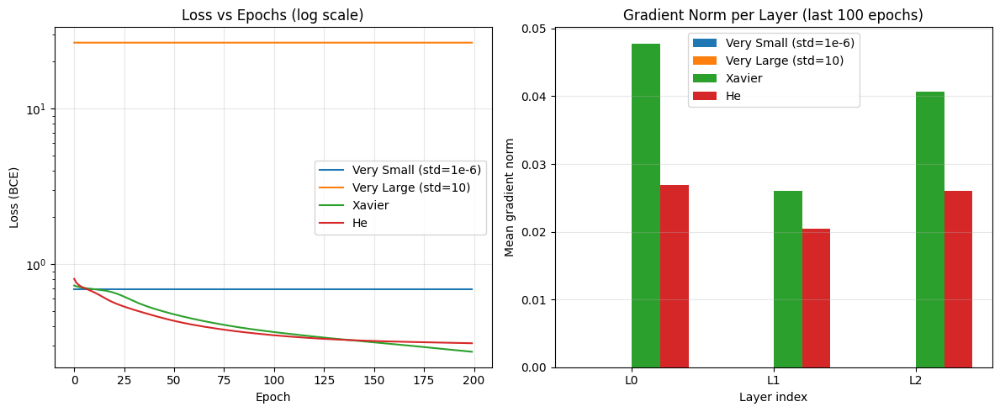

In [4]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Loss vs epochs (Use log scale for loss to better see differences)
ax = axes[0]
for name, nn in results.items():
    ax.plot(nn.loss_history, label=name)
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss (BCE)")
ax.set_title("Loss vs Epochs (log scale)")
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_yscale("log")  # Use log scale for loss curve

# Optionally, also limit y range to remove the effect of huge losses (uncomment to use):
# ax.set_ylim(1e-3, 10)

# Gradient norm per layer (averaged over last 100 epochs)
ax = axes[1]
n_layers = len(layer_specs)
x = np.arange(n_layers)
width = 0.2
for i, (name, nn) in enumerate(results.items()):
    recent = np.array(nn.grad_norms_history[-100:])  # shape (100, n_layers)
    mean_norms = np.mean(recent, axis=0)
    ax.bar(x + i * width, mean_norms, width, label=name)
ax.set_xlabel("Layer index")
ax.set_ylabel("Mean gradient norm")
ax.set_title("Gradient Norm per Layer (last 100 epochs)")
ax.set_xticks(x + width * 1.5)
ax.set_xticklabels([f"L{i}" for i in range(n_layers)])
ax.legend()
ax.grid(True, alpha=0.3, axis="y")

plt.tight_layout()
plt.show()

### Animation: Initialization effect in action
Watch how loss curves evolve during training for each initialization strategy.

In [5]:
# Animation: Loss curves evolving over training (initialization effect in action)
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(8, 5))
ax.set_xlim(0, max(len(nn.loss_history) for nn in results.values()))

# To ensure all curves (including "Very Large") show, set y-limits AFTER plotting some initial data.
max_epochs = max(len(nn.loss_history) for nn in results.values())
lines = {}
for name, nn in results.items():
    # Start each curve with epoch 1 and its initial loss (if available; else empty)
    epochs = [1] if len(nn.loss_history) else []
    loss = [nn.loss_history[0]] if len(nn.loss_history) else []
    lines[name], = ax.plot(epochs, loss, label=name)
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss (BCE)")
ax.set_title("Loss Curves During Training (Animated)")
ax.axhline(1e-3, color="gray", alpha=0.3, linestyle="--")
ax.legend(loc="upper right", fontsize=9)
ax.grid(True, alpha=0.3)
ax.set_yscale("log")

# Set y-limits to encompass all loss histories (min over all nonzero loss points, max over all)
all_losses = []
for nn in results.values():
    all_losses.extend([l for l in nn.loss_history if l > 0])
if all_losses:
    ymin = max(min(all_losses), 1e-5)
    ymax = max(all_losses)
    # Extend ymax so "Very Large" isn't squashed at the top,
    # but don't make it too huge if an outlier occurs.
    ax.set_ylim(ymin, min(ymax*1.2, 1e3))
else:
    ax.set_ylim(1e-3, 10)

def init():
    for line in lines.values():
        line.set_data([], [])
    return list(lines.values())

def update(frame):
    for name, nn in results.items():
        ep = min(frame, len(nn.loss_history))
        # Plot from epoch 1 for all curves, but allow empty for missing
        epochs = list(range(1, ep + 1))
        loss = nn.loss_history[:ep]
        lines[name].set_data(epochs, loss)
    # Re-adjust y-limits if running off-scale. (Prevent "Very Large" from getting clipped)
    displayed_losses = []
    for nn in results.values():
        upto = min(frame, len(nn.loss_history))
        displayed_losses.extend([l for l in nn.loss_history[:upto] if l > 0])
    if displayed_losses:
        # Don't go below log-lower-bound even if loss crashes
        ymin = max(min(displayed_losses), 1e-5)
        ymax = max(displayed_losses)
        ax.set_ylim(ymin, min(ymax*1.2, 1e3))
    ax.legend(loc="upper right", fontsize=9)
    return list(lines.values())

skip = max(1, min(5, max_epochs // 80))
anim = FuncAnimation(fig, update, init_func=init, frames=range(0, max_epochs + 1, skip),
                     interval=80, blit=True)
plt.close()
HTML(anim.to_jshtml())

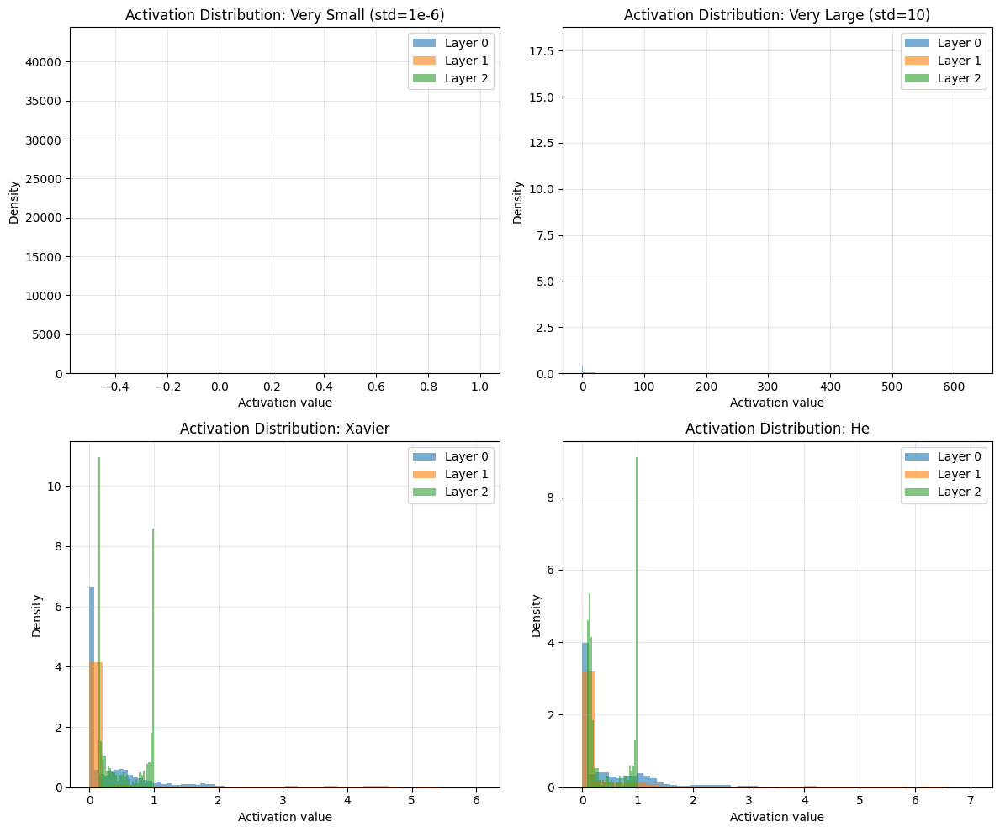

In [6]:
# Activation distribution histograms per layer (after training, one forward pass)
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for idx, (name, nn) in enumerate(results.items()):
    ax = axes[idx]
    caches = nn.forward(X_data)
    for i, (z, a) in enumerate(caches):
        a_flat = a.flatten()
        ax.hist(a_flat, bins=30, alpha=0.6, label=f"Layer {i}", density=True)
    ax.set_xlabel("Activation value")
    ax.set_ylabel("Density")
    ax.set_title(f"Activation Distribution: {name}")
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### What is happening? Why?

- **Very small**: Activations collapse; tiny weights → tiny weight gradients. Learning stalls.
- **Very large**: Pre-activations explode; gradients blow up. Training fails (loss rises or stays high).
- **Xavier**: Preserves variance across layers. Works well with ReLU; loss converges.
- **He**: Designed for ReLU—scales by √(2/fan_in) to account for the "dead half". Best match for ReLU hidden layers; loss converges.

**Key Observations**
- Very small: loss flat; gradient norms near zero; no learning
- Very large: loss high/divergent; gradients explode; training fails
- Xavier and He: loss converges; gradient norms balanced across layers

---
## Section 2: Activation Function Depth Study

We compare **sigmoid** vs **ReLU** as depth increases (2, 3, 5 layers). For each configuration we measure:

- **Gradient norm decay** across layers (backprop flows backward; earlier layers get smaller gradients)
- **Activation saturation** (sigmoid: % of activations in [0, 0.01] or [0.99, 1])
- **Dead neuron %** (ReLU: % of activations exactly 0)

**Mathematical insight**: Backprop multiplies gradients by activation derivatives. For sigmoid, σ'(z) ≤ 0.25 everywhere, and in saturated regions σ' ≈ 0. So gradient shrinks by ≤0.25 per layer → **exponential vanishing** with depth. ReLU has derivative 1 when active, 0 when dead — no shrinkage when active, but dead neurons block gradient flow entirely.

In [7]:
# Build networks: 2, 3, 5 layers (by number of weight matrices)
depth_configs = {
    2: [(2, 4, "relu"), (4, 4, "relu"), (4, 1, "sigmoid")],
    3: [(2, 4, "relu"), (4, 4, "relu"), (4, 4, "relu"), (4, 1, "sigmoid")],
    5: [(2, 4, "relu"), (4, 4, "relu"), (4, 4, "relu"), (4, 4, "relu"), (4, 4, "relu"), (4, 1, "sigmoid")],
}

depth_results = {"sigmoid": {}, "relu": {}}

def _layer_specs(dims, hidden_act):
    for i in range(len(dims)):
        if i == len(dims)-1:
            dims[i] = (dims[i][0], dims[i][1], "sigmoid")
        else:
            dims[i] = (dims[i][0], dims[i][1], hidden_act)
    return dims

for depth, dims in depth_configs.items():
    nn_sig = MultiLayerNN(_layer_specs(dims, "sigmoid"), activation="sigmoid", initialization="xavier", learning_rate=0.15, seed=42)
    nn_sig.fit(X_data, y_data_2d, epochs=1500, track_stats=True)
    depth_results["sigmoid"][depth] = nn_sig
    nn_relu = MultiLayerNN(_layer_specs(dims, "relu"), initialization="xavier", learning_rate=0.15, seed=42)
    nn_relu.fit(X_data, y_data_2d, epochs=1500, track_stats=True)
    depth_results["relu"][depth] = nn_relu

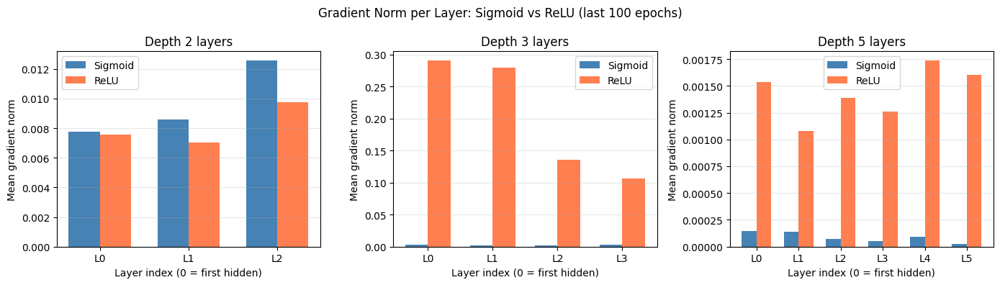

In [8]:
# Gradient norm per layer (bar plot) - compare sigmoid vs ReLU
fig, axes = plt.subplots(1, 3, figsize=(14, 4))
for i, depth in enumerate([2, 3, 5]):
    ax = axes[i]
    nn_sig = depth_results["sigmoid"][depth]
    nn_relu = depth_results["relu"][depth]
    n_layers = len(nn_sig.weights)
    x = np.arange(n_layers)
    recent_sig = np.mean(nn_sig.grad_norms_history[-100:], axis=0)
    recent_relu = np.mean(nn_relu.grad_norms_history[-100:], axis=0)
    width = 0.35
    ax.bar(x - width/2, recent_sig, width, label="Sigmoid", color="steelblue")
    ax.bar(x + width/2, recent_relu, width, label="ReLU", color="coral")
    ax.set_xlabel("Layer index (0 = first hidden)")
    ax.set_ylabel("Mean gradient norm")
    ax.set_title(f"Depth {depth} layers")
    ax.set_xticks(x)
    ax.set_xticklabels([f"L{j}" for j in range(n_layers)])
    ax.legend()
    ax.grid(True, alpha=0.3, axis="y")

plt.suptitle("Gradient Norm per Layer: Sigmoid vs ReLU (last 100 epochs)")
plt.tight_layout()
plt.show()

### Animation: Gradient norms by depth
Gradient norms per layer evolve over training — sigmoid vs ReLU at depth 5.

In [19]:
# Animation: Gradient norms per layer evolving during training (depth effect)
# Focus on depth 5: sigmoid vs ReLU
depth = 5
nn_sig = depth_results["sigmoid"][depth]
nn_relu = depth_results["relu"][depth]
n_layers = len(nn_sig.grad_norms_history[0]) if nn_sig.grad_norms_history else 0

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
x_pos = np.arange(n_layers)
bars_sig = axes[0].bar(x_pos - 0.2, np.zeros(n_layers), 0.4, label="Sigmoid", color="C0", alpha=0.8)
bars_relu = axes[1].bar(x_pos - 0.2, np.zeros(n_layers), 0.4, label="ReLU", color="C1", alpha=0.8)
for ax in axes:
    ax.set_xlabel("Layer")
    ax.set_ylabel("Mean gradient norm (log scale)")
    ax.set_yscale("log")
    ax.set_ylim(1e-8, 1)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([f"L{i}" for i in range(n_layers)])
axes[0].set_title("Sigmoid: Grad norms over training")
axes[1].set_title("ReLU: Grad norms over training")

def init():
    for b in bars_sig:
        b.set_height(1e-9)
    for b in bars_relu:
        b.set_height(1e-9)
    return list(bars_sig.patches) + list(bars_relu.patches)

def update(frame):
    win = 30
    t = min(frame, len(nn_sig.grad_norms_history) - 1)
    start = max(0, t - win)
    g_sig = np.mean(nn_sig.grad_norms_history[start : t + 1], axis=0)
    g_relu = np.mean(nn_relu.grad_norms_history[start : t + 1], axis=0)
    for i, b in enumerate(bars_sig):
        b.set_height(max(1e-9, g_sig[i]))
    for i, b in enumerate(bars_relu):
        b.set_height(max(1e-9, g_relu[i]))
    axes[0].set_title(f"Sigmoid: Grad norms (epochs 1–{t+1})")
    axes[1].set_title(f"ReLU: Grad norms (epochs 1–{t+1})")
    return list(bars_sig.patches) + list(bars_relu.patches)

max_f = len(nn_sig.grad_norms_history) - 1
skip = max(1, max_f // 60)
anim = FuncAnimation(fig, update, init_func=init, frames=range(0, max_f + 1, skip),
                     interval=80, blit=True)
plt.close()
HTML(anim.to_jshtml())

/var/folders/94/9smcpssj4zj8qjj3hprn95840000gn/T/ipykernel_37660/3565677100.py:15: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale("log")
/var/folders/94/9smcpssj4zj8qjj3hprn95840000gn/T/ipykernel_37660/3565677100.py:15: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale("log")


### Animation: Dead neuron heatmap

Rows = neurons (first hidden layer), columns = epochs. Dark = dead (ReLU output 0). Bad initialization causes many neurons to stay dead.

In [10]:
# Train ReLU network with bad init to induce dead neurons; record per-neuron activations
np.random.seed(42)
layers_dead = [(2, 8, "relu"), (8, 8, "relu"), (8, 1, "sigmoid")]
nn_dead = MultiLayerNN(layers_dead, weight_init_std=1e-3, learning_rate=0.1, seed=42)

act_history = []  # each element: mean activation per neuron, shape (n_neurons,)
epochs_hm = 300
for epoch in range(epochs_hm):
    caches = nn_dead.forward(X_data)
    a0 = caches[0][1]  # first hidden layer, shape (n_samples, n_neurons)
    act_history.append(np.mean(a0, axis=0))  # mean over samples
    wGrads, bGrads, _ = nn_dead.backward(X_data, y_data_2d, caches)
    nn_dead.update_params(wGrads, bGrads)

H = np.array(act_history).T  # shape (n_neurons, n_epochs); rows=neurons, cols=epochs

fig, ax = plt.subplots(figsize=(10, 5))
vmax = np.percentile(H[H > 0], 95) if np.any(H > 0) else 1
im = ax.imshow(H[:, :1], aspect="auto", cmap="viridis", vmin=0, vmax=vmax)
ax.set_xlabel("Epoch")
ax.set_ylabel("Neuron (first hidden layer)")
ax.set_title("Activation heatmap: dead neurons = dark")
cbar = fig.colorbar(im, ax=ax, label="Mean activation")

def init():
    im.set_data(H[:, :1])
    ax.set_xlim(0, H.shape[1])
    return [im]

def update(frame):
    t = min(frame, H.shape[1] - 1)
    im.set_data(H[:, : t + 1])
    im.set_extent([0, t + 1, H.shape[0] - 0.5, -0.5])
    ax.set_title(f"Epochs 1–{t+1} (dead neurons = dark)")
    return [im]

skip = max(1, epochs_hm // 60)
anim = FuncAnimation(fig, update, init_func=init, frames=range(0, H.shape[1], skip),
                     interval=80, blit=False)
plt.close()
HTML(anim.to_jshtml())

In [11]:
# Saturation % (sigmoid) and Dead neuron % (ReLU)
print("Activation Saturation (sigmoid) and Dead Neuron % (ReLU) - last epoch\n")
for depth in [2, 3, 5]:
    nn_sig = depth_results["sigmoid"][depth]
    nn_relu = depth_results["relu"][depth]
    stats_sig = nn_sig.activation_stats_history[-1]
    stats_relu = nn_relu.activation_stats_history[-1]
    print(f"Depth {depth}:")
    for key in stats_sig:
        sat = stats_sig[key]["saturation_pct"]
        dead = stats_relu[key]["dead_pct"]
        print(f"  {key}: sigmoid saturation = {sat:.1f}%, ReLU dead = {dead:.1f}%")
    print()

Activation Saturation (sigmoid) and Dead Neuron % (ReLU) - last epoch

Depth 2:
  layer_0: sigmoid saturation = 0.0%, ReLU dead = 48.9%
  layer_1: sigmoid saturation = 0.0%, ReLU dead = 68.0%
  layer_2: sigmoid saturation = 0.0%, ReLU dead = 0.0%

Depth 3:
  layer_0: sigmoid saturation = 0.0%, ReLU dead = 10.3%
  layer_1: sigmoid saturation = 0.0%, ReLU dead = 54.7%
  layer_2: sigmoid saturation = 0.0%, ReLU dead = 53.4%
  layer_3: sigmoid saturation = 0.0%, ReLU dead = 0.0%

Depth 5:
  layer_0: sigmoid saturation = 0.0%, ReLU dead = 33.0%
  layer_1: sigmoid saturation = 0.0%, ReLU dead = 81.7%
  layer_2: sigmoid saturation = 0.0%, ReLU dead = 81.3%
  layer_3: sigmoid saturation = 0.0%, ReLU dead = 60.7%
  layer_4: sigmoid saturation = 0.0%, ReLU dead = 47.6%
  layer_5: sigmoid saturation = 0.0%, ReLU dead = 0.0%



### Multiplicative shrinkage in action

The chain rule gives:
$$
    \frac{∂L}{∂W_ℓ} ∝ \frac{∂L}{∂a_L} \cdot ∏_{k=ℓ+1}^{L} (\frac{∂a_k}{∂z_k} \cdot \frac{∂z_k}{∂a_{k-1}})
$$
For sigmoid, each
$$
    \frac{∂a}{∂z} = σ'(z) ≤ 0.25
$$
so the product decays as $$ 0.25^{L-ℓ} $$
With 5 layers, gradients at early layers are ~0.25^4 ≈ 0.004× the output gradient. ReLU avoids this when neurons are active (derivative=1), but dead neurons (derivative=0) block flow entirely.

**Key Observations**
- Sigmoid: gradient norms shrink exponentially toward earlier layers; deeper networks show stronger decay
- ReLU: gradient norms more uniform when neurons stay active; dead neurons increase with depth
- Saturation (sigmoid) and dead % (ReLU) tend to rise with depth, limiting effective gradient flow

---
## Section 3: Visualizing Loss Landscape

For a **very small network** (few parameters), we fix all parameters except **two**, sweep those two across a grid, and compute the loss surface. This reveals:

- **Non-convex valleys** — many local minima and basins
- **Saddle-like structures** — flat directions where curvature changes sign
- **Flat regions** — plateaus where gradients are tiny

**Why convexity disappears**: Neural network loss L(θ) is a composition of non-linear activations. Even for a simple 2-layer net, L is non-convex in θ. With many parameters, saddle points become overwhelmingly more common than local minima in high dimensions.

In [12]:
# Minimal network: 2 inputs, 2 hidden, 1 output — few parameters
nn_landscape = MultiLayerNN([2, 2, 1], activation="sigmoid", initialization="xavier", seed=42)
nn_landscape.fit(X_data, y_data_2d, epochs=500)

# Pick two weights to sweep: W1[0,0] and W1[1,0] (first layer)
W1 = nn_landscape.weights[0]
base_val_0, base_val_1 = W1[0, 0], W1[1, 0]

def loss_at_params(nn, x, y, val0, val1):
    """Compute loss when W1[0,0]=val0, W1[1,0]=val1; other params fixed."""
    nn.weights[0][0, 0] = val0
    nn.weights[0][1, 0] = val1
    caches = nn.forward(x)
    return nn.compute_loss(y, caches[-1][1])

# Grid sweep
n_grid = 50
v0 = np.linspace(base_val_0 - 2, base_val_0 + 2, n_grid)
v1 = np.linspace(base_val_1 - 2, base_val_1 + 2, n_grid)
V0, V1 = np.meshgrid(v0, v1)
L = np.zeros_like(V0)
for i in range(n_grid):
    for j in range(n_grid):
        L[i, j] = loss_at_params(nn_landscape, X_data, y_data_2d, V0[i, j], V1[i, j])

# Restore original params
nn_landscape.weights[0][0, 0] = base_val_0
nn_landscape.weights[0][1, 0] = base_val_1

### Animation: Training path on loss landscape
Watch the optimizer move across the non-convex loss surface toward a minimum.

In [13]:
# Animation: Training trajectory on the loss landscape
# Retrain a small network while recording the 2D weight path, then animate
np.random.seed(43)  # Slightly different seed for variety in trajectory
nn_traj = MultiLayerNN([2, 2, 1], activation="sigmoid", initialization="xavier", seed=43)
traj_w0, traj_w1 = [], []
epochs_traj = 150
for _ in range(epochs_traj):
    caches = nn_traj.forward(X_data)
    y_hat = caches[-1][1]
    wGrads, bGrads, _ = nn_traj.backward(X_data, y_data_2d, caches)
    nn_traj.update_params(wGrads, bGrads)
    traj_w0.append(nn_traj.weights[0][0, 0])
    traj_w1.append(nn_traj.weights[0][1, 0])
traj_w0, traj_w1 = np.array(traj_w0), np.array(traj_w1)

fig, ax = plt.subplots(figsize=(8, 6))
cf = ax.contourf(V0, V1, L, levels=20, cmap="viridis")
ax.contour(V0, V1, L, levels=15, colors="black", alpha=0.4, linewidths=0.5)
ax.set_xlabel("$W_1[0,0]$")
ax.set_ylabel("$W_1[1,0]$")
ax.set_title("Training Path on Loss Landscape (Animated)")
pt, = ax.plot([], [], "wo", markersize=8, markeredgecolor="white", markeredgewidth=2)
path_line, = ax.plot([], [], "w-", alpha=0.5, linewidth=1)

def init():
    pt.set_data([], [])
    path_line.set_data([], [])
    return pt, path_line

def update(frame):
    f = min(frame, len(traj_w0) - 1)
    pt.set_data([traj_w0[f]], [traj_w1[f]])
    path_line.set_data(traj_w0[: f + 1], traj_w1[: f + 1])
    return pt, path_line

skip = max(1, epochs_traj // 50)
anim = FuncAnimation(fig, update, init_func=init, frames=range(0, len(traj_w0), skip),
                     interval=80, blit=True)
plt.close()
HTML(anim.to_jshtml())

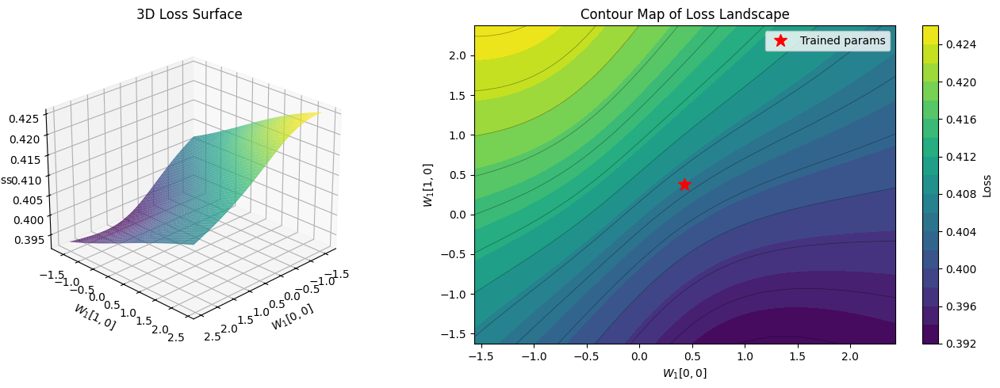

In [14]:
fig = plt.figure(figsize=(14, 5))

# 3D surface
ax1 = fig.add_subplot(121, projection="3d")
ax1.plot_surface(V0, V1, L, cmap="viridis", alpha=0.8)
ax1.set_xlabel("$W_1[0,0]$")
ax1.set_ylabel("$W_1[1,0]$")
ax1.set_zlabel("Loss")
ax1.set_title("3D Loss Surface")
ax1.view_init(elev=25, azim=45)

# Contour map
ax2 = fig.add_subplot(122)
cf = ax2.contourf(V0, V1, L, levels=20, cmap="viridis")
ax2.contour(V0, V1, L, levels=15, colors="black", alpha=0.4, linewidths=0.5)
ax2.plot(base_val_0, base_val_1, "r*", markersize=12, label="Trained params")
ax2.set_xlabel("$W_1[0,0]$")
ax2.set_ylabel("$W_1[1,0]$")
ax2.set_title("Contour Map of Loss Landscape")
ax2.legend()
plt.colorbar(cf, ax=ax2, label="Loss")
plt.tight_layout()
plt.show()

### Why convexity disappeared; why saddle points are common

The loss is a nested composition of non-linear functions. Even with one hidden layer, L(W₁,W₂) is non-convex. In high dimensions, critical points (∇L=0) are usually **saddle points**: some directions curve upward, others downward. True local minima are rare; saddle points dominate and can trap or slow optimization.

**Key Observations**
- Loss surface is non-convex: valleys, ridges, flat regions
- Saddle-like structures visible where curvature changes
- Trained solution (red star) often lies in a basin, not necessarily the global minimum

---
## Section 4: Gradient Explosion & Vanishing Demonstration

We artificially manipulate **initialization scale** and **depth** to show:

1. **Exponential shrinkage** (sigmoid + standard init): gradients decay as they flow backward
2. **Exponential growth** (large weights): gradients explode with depth

We plot **log(gradient norm) vs layer index** to reveal the multiplicative nature: in log-space, exponential behavior appears as a straight line.

**Mathematical insight**: ∂L/∂W_ℓ involves a product of Jacobians. Each factor is O(‖W‖) or O(σ'). For sigmoid, σ' ≤ 0.25 → product shrinks. For large W, each ‖∂z/∂a‖ grows → product explodes.

In [15]:
# Depth sweep: 2, 4, 6, 8 layers (increasing depth)
depth_list = [2, 4, 6, 8]

def make_dims(depth):
    """depth = number of weight matrices. Hidden layers have 4 units each."""
    return [2] + [4] * (depth - 1) + [1]

explode_vanish = {"sigmoid_xavier": {}, "sigmoid_large": {}}

for d in depth_list:
    dims = make_dims(d)
    # Vanishing: sigmoid + Xavier
    nn_v = MultiLayerNN(dims, activation="sigmoid", initialization="xavier", seed=42)
    nn_v.fit(X_data, y_data_2d, epochs=100, track_stats=True)
    explode_vanish["sigmoid_xavier"][d] = nn_v
    # Explosion: sigmoid + large init
    nn_e = MultiLayerNN(dims, activation="sigmoid", weight_init_std=3.0, seed=42)
    nn_e.fit(X_data, y_data_2d, epochs=100, track_stats=True)
    explode_vanish["sigmoid_large"][d] = nn_e

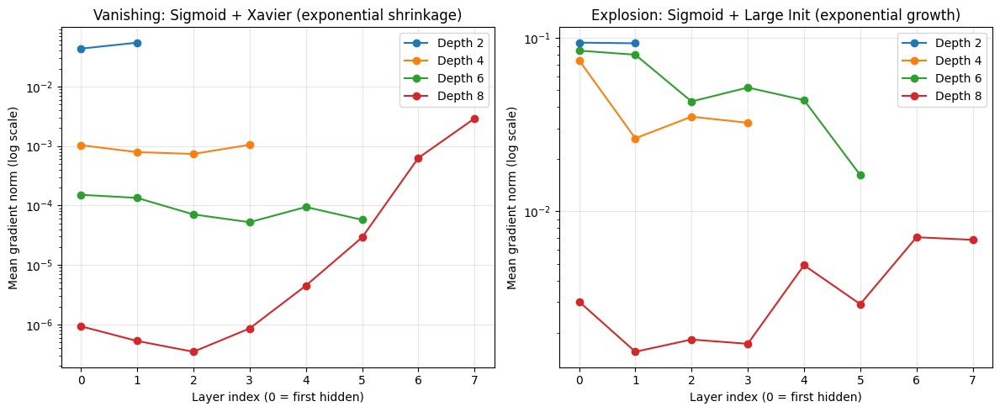

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Left: log(gradient norm) vs layer (sigmoid + Xavier) — vanishing
ax = axes[0]
for d in depth_list:
    nn = explode_vanish["sigmoid_xavier"][d]
    norms = np.mean(nn.grad_norms_history[-20:], axis=0)
    layer_idx = np.arange(len(norms))
    ax.semilogy(layer_idx, norms + 1e-15, "o-", label=f"Depth {d}")
ax.set_xlabel("Layer index (0 = first hidden)")
ax.set_ylabel("Mean gradient norm (log scale)")
ax.set_title("Vanishing: Sigmoid + Xavier (exponential shrinkage)")
ax.legend()
ax.grid(True, alpha=0.3)

# Right: log(gradient norm) vs layer (sigmoid + large init) — explosion
ax = axes[1]
for d in depth_list:
    nn = explode_vanish["sigmoid_large"][d]
    norms = np.mean(nn.grad_norms_history[-20:], axis=0)
    layer_idx = np.arange(len(norms))
    ax.semilogy(layer_idx, norms + 1e-15, "o-", label=f"Depth {d}")
ax.set_xlabel("Layer index (0 = first hidden)")
ax.set_ylabel("Mean gradient norm (log scale)")
ax.set_title("Explosion: Sigmoid + Large Init (exponential growth)")
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### Animation: Explosion vs vanishing gradients
Gradient norms evolve over training — Xavier (vanishing) vs large init (explosion) at depth 8.

In [17]:
# Animation: Gradient explosion vs vanishing over training (depth 8)
d = 8
nn_van = explode_vanish["sigmoid_xavier"][d]
nn_exp = explode_vanish["sigmoid_large"][d]
n_layers = len(nn_van.grad_norms_history[0]) if nn_van.grad_norms_history else 0

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
x_pos = np.arange(n_layers)
bars_van = axes[0].bar(x_pos - 0.2, np.ones(n_layers) * 1e-9, 0.4, color="C0", alpha=0.8)
bars_exp = axes[1].bar(x_pos - 0.2, np.ones(n_layers) * 1e-9, 0.4, color="C2", alpha=0.8)
axes[0].set_xlabel("Layer")
axes[1].set_xlabel("Layer")
for ax in axes:
    ax.set_ylabel("Mean gradient norm (log scale)")
    ax.set_yscale("log")
    ax.set_xticks(x_pos)
    ax.set_xticklabels([f"L{i}" for i in range(n_layers)])
axes[0].set_title("Xavier init (vanishing)")
axes[1].set_title("Large init (explosion)")
# Use shared ylim based on data range
all_van = [g for h in nn_van.grad_norms_history for g in h]
all_exp = [g for h in nn_exp.grad_norms_history for g in h]
ylo = max(1e-12, min(all_van + all_exp) * 0.5)
yhi = max(max(all_van + all_exp) * 2, 1)
for ax in axes:
    ax.set_ylim(ylo, yhi)

def init():
    for b in bars_van:
        b.set_height(1e-9)
    for b in bars_exp:
        b.set_height(1e-9)
    return list(bars_van.patches) + list(bars_exp.patches)

def update(frame):
    win = 15
    t = min(frame, len(nn_van.grad_norms_history) - 1)
    start = max(0, t - win)
    g_van = np.mean(nn_van.grad_norms_history[start : t + 1], axis=0)
    g_exp = np.mean(nn_exp.grad_norms_history[start : t + 1], axis=0)
    for i, b in enumerate(bars_van):
        b.set_height(max(1e-12, g_van[i]))
    for i, b in enumerate(bars_exp):
        b.set_height(max(1e-12, g_exp[i]))
    axes[0].set_title(f"Xavier (vanishing) — epochs 1–{t+1}")
    axes[1].set_title(f"Large (explosion) — epochs 1–{t+1}")
    return list(bars_van.patches) + list(bars_exp.patches)

max_f = len(nn_van.grad_norms_history) - 1
skip = max(1, max_f // 50)
anim = FuncAnimation(fig, update, init_func=init, frames=range(0, max_f + 1, skip),
                     interval=80, blit=True)
plt.close()
HTML(anim.to_jshtml())

### Multiplicative nature made explicit

Gradient at layer ℓ is proportional to a product of (activation derivative × weight matrix) over all downstream layers. With L layers, that's L−ℓ factors. If each factor < 1 → exponential decay. If each factor > 1 → exponential growth. Log(gradient norm) vs layer index should be roughly linear when the process is multiplicative.

**Key Observations**
- Vanishing: gradient norms at early layers fall exponentially; deeper networks show stronger decay
- Explosion: gradient norms at early layers can blow up; training becomes unstable
- Proper initialization (Xavier/He) and ReLU help keep the multiplicative factors near 1

---
## Section 5: Conceptual Summary

A unified view of what we have explored and why it matters for deep learning.

### 1. Convex vs Non-Convex

- **Convex optimization**: One global minimum; gradient descent is guaranteed to converge.
- **Neural networks**: Loss is non-convex. Many local minima, saddle points, and flat regions. We optimize anyway because (a) many minima are "good enough," (b) saddle points can be escaped, (c) stochasticity helps exploration.

### 2. Representation Learning

- Each layer learns a **representation** of the input. Early layers capture low-level features; deeper layers compose them into higher-level abstractions.
- Non-linear activations enable this hierarchy. Without them, the whole network would collapse to a single linear transform.

### 3. Symmetry Breaking

- With identical initialization (e.g. all zeros for weights), neurons in a layer would receive identical gradients and stay identical — **symmetry**. Learning would fail.
- **Random initialization** breaks symmetry: each neuron follows a different path and specializes. This is why we initialize weights randomly (with appropriate scale).

### 4. Initialization Theory

- **Xavier** (Glorot): For sigmoid/tanh, use Var(W) = 1/fan_in so that Var(z) ≈ Var(a) across layers.
- **He (Kaiming)**: For ReLU, use Var(W) = 2/fan_in because ReLU zeros half the activations, effectively halving the variance of the pre-activation.
- Scale matters: too small → vanishing; too large → explosion.

### 5. Gradient Flow Management

- **Vanishing**: Gradients shrink through the chain rule (σ' ≤ 0.25 for sigmoid). Mitigations: ReLU, residual connections, better initialization.
- **Explosion**: Gradients grow when weights are large. Mitigations: gradient clipping, smaller init, batch norm.
- **Dead ReLUs**: Neurons stuck at 0 never recover. Mitigations: Leaky ReLU, better init (He).

**Key Observations**
- Deep learning succeeds despite non-convexity because the loss landscape has many acceptable minima
- Initialization and activation choice directly affect gradient flow
- Understanding these mechanisms is essential for designing and debugging deep networks